<i><span style="color:#e74c3c;"><b>MAIN GOAL: </b> I tried to classify multi-labeled arXiv articles using a FNet. (Mixing Tokens with Fourier Transforms) [1] model.</span></i>


* I applied several <b>preprocessing</b> operations (cleaning,dropping stop words etc.),
* I created <b>multi-class</b> labels,
* Used <b>tf.data pipeline</b> for efficient training,
* I created <b>Vocabulary</b> and trained <b>Tokenizer</b> using the train data,
* 5 KFold <b>cross validation</b>,
* I have modified this notebook [2],
* A function for end-2-end pipeline

## Test Prediction
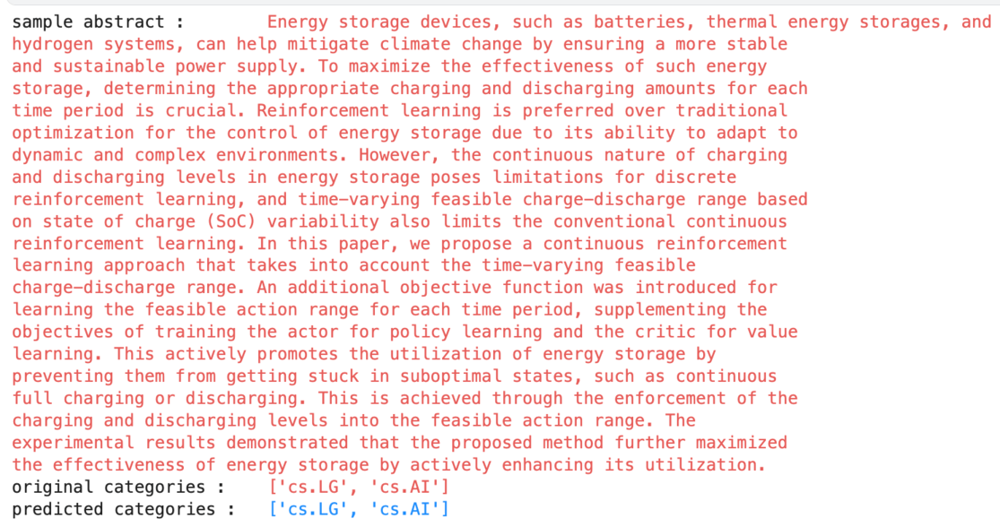

## My Another Projects
* [Yelp Review Stars Prediction w/Gemma 7B (LoRA)](https://www.kaggle.com/code/banddaniel/yelp-review-stars-prediction-w-gemma-7b-lora)
* [PaliGemma 3B for License Plate OCR](https://www.kaggle.com/code/banddaniel/paligemma-3b-for-license-plate-ocr)

## References
1. Lee-Thorp, J., Ainslie, J., Eckstein, I., & Ontanon, S. (2021). FNet: Mixing Tokens with Fourier Transforms (Version 4). arXiv. https://doi.org/10.48550/ARXIV.2105.03824
2. https://keras.io/examples/nlp/fnet_classification_with_keras_nlp/


In [1]:
import os
import pandas as pd
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
import string
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)
from colorama import Fore, Back, Style

from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_squared_error, classification_report, confusion_matrix, f1_score, accuracy_score, ConfusionMatrixDisplay

import tensorflow as tf 
from tensorflow.keras.layers import *
import keras_nlp
from keras_nlp.layers import *
from tensorflow.keras.models import Model

SEED = 82
BATCH_SIZE = 64
AUTO = tf.data.AUTOTUNE

VOCAB_SIZE = 5000
EMBED_DIM = 128
INTERMEDIATE_DIM = 256

2024-05-28 13:27:21.435836: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 13:27:21.435953: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 13:27:21.585707: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# <span style="color:#e74c3c;"> Reading </span> Data

In [2]:
data = pd.read_csv('/kaggle/input/arxiv-multi-label-text-classification-datasets/arxiv34k6L.csv')
data.drop_duplicates(subset = "Abstracts", inplace = True)
data = data.sample(frac = 1, random_state = SEED).reset_index(drop = True)

# created new columns
data['cs.CV'] = 0
data['cs.LG'] = 0
data['cs.AI'] = 0
data['stat.ML'] = 0

unique_cats = ['cs.CV', 'cs.LG', 'cs.AI', 'stat.ML']

data.head()

,Abstracts,categories,cs.CV,cs.LG,cs.AI,stat.ML
0,Recent research that combines implicit 3D repr...,"['cs.CV', 'cs.AI']",0,0,0,0
1,"In the evolving field of machine learning, vid...",['cs.CV'],0,0,0,0
2,The metro ridership prediction has always rece...,['cs.LG'],0,0,0,0
3,Although much research has been done on propos...,['cs.LG'],0,0,0,0
4,Despite the remarkable success of generative a...,"['cs.CV', 'cs.LG']",0,0,0,0


In [3]:
# created multi-class labels

for i in range(data.shape[0]):
    categories = data.iloc[i].categories
    cat_splitting = re.split("'", categories)
    common_cats = np.intersect1d(cat_splitting, unique_cats)
    for cat in common_cats:
        data[cat][i] = 1

/tmp/ipykernel_23/441250453.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[cat][i] = 1
/tmp/ipykernel_23/441250453.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[cat][i] = 1
/tmp/ipykernel_23/441250453.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[cat][i] = 1
/tmp/ipykernel_23/441250453.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the

# <span style="color:#e74c3c;"> Preprocessing </span>

In [4]:
%%time
# preprocessing functions
stop_words = set(stopwords.words('english'))

def text_preprocessing(text):
    text = str(text)
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('@\w+\s*', '', text)
    text = re.sub("\\W"," ",text) 
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('http', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub(r'[\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F1E0-\U0001F1FF]', '', text)
    return text

def drop_stopwords(text):
    dropped = [word for word in text.split() if word not in stop_words]
    final_text = ' '.join(dropped)
    return final_text


def delete_one_characters(text):
    deleted = [word if len(word)>1 else "" for word in text.split()]
    final_text = ' '.join(deleted)
    return final_text


# applying preprocessing functions 
full_data = data.copy()
full_data['preprocessed_Abstracts'] = data['Abstracts'].apply(text_preprocessing).apply(drop_stopwords).apply(delete_one_characters)

CPU times: user 14.7 s, sys: 37.2 ms, total: 14.8 s
Wall time: 14.8 s


In [5]:
# calculating max token numbers and dropping samples have 0,1 or 2 tokens
full_data['max']= full_data['preprocessed_Abstracts'].apply(lambda X: len(X.split()))

drop_idx = full_data[(full_data['max'] == 0) | (full_data['max'] == 1) | (full_data['max'] == 2)].index
full_data.drop(index = drop_idx, inplace = True)


# set the max sequence length of full dataset
MAX_SEQUENCE_LENGTH = full_data['max'].max()

print('final sample size: \t', full_data.shape[0])
print('max sequence length: \t', MAX_SEQUENCE_LENGTH)

final sample size: 	 27255
max sequence length: 	 244


In [6]:
# final dataframe
full_data.head()

,Abstracts,categories,cs.CV,cs.LG,cs.AI,stat.ML,preprocessed_Abstracts,max
0,Recent research that combines implicit 3D repr...,"['cs.CV', 'cs.AI']",1,0,1,0,recent research combines implicit representati...,104
1,"In the evolving field of machine learning, vid...",['cs.CV'],1,0,0,0,evolving field machine learning video generati...,105
2,The metro ridership prediction has always rece...,['cs.LG'],0,1,0,0,metro ridership prediction always received ext...,96
3,Although much research has been done on propos...,['cs.LG'],0,1,0,0,although much research done proposing new mode...,107
4,Despite the remarkable success of generative a...,"['cs.CV', 'cs.LG']",1,1,0,0,despite remarkable success generative adversar...,125


# <span style="color:#e74c3c;"> Dataset </span> Splitting

In [7]:
# train,validation and test splitting

train_val_data, test_data = train_test_split(full_data, test_size = 0.13, random_state = SEED)
train_data, val_data = train_test_split(train_val_data, test_size = 0.15, random_state = SEED)


train_data.reset_index(drop = True, inplace = True)
val_data.reset_index(drop = True, inplace = True)
test_data.reset_index(drop = True, inplace = True)

print('train samples :\t', train_data.shape[0])
print('val samples :\t', val_data.shape[0])
print('test samples :\t', test_data.shape[0])

train samples :	 20154
val samples :	 3557
test samples :	 3544


# <span style="color:#e74c3c;"> Create </span> Vocabulary and Tokenizer

In [8]:
%%time
# Creating Vocabulary and Tokenizer

train_dataset_for_vocab = tf.data.Dataset.from_tensor_slices(train_data['preprocessed_Abstracts'].values)
reserved_tokens = ["[PAD]", "[UNK]"]

# creating vocabulary
vocab = keras_nlp.tokenizers.compute_word_piece_vocabulary(train_dataset_for_vocab, VOCAB_SIZE, reserved_tokens = reserved_tokens)

# creating tokenizer
tokenizer = keras_nlp.tokenizers.WordPieceTokenizer(vocabulary = vocab, lowercase = True, sequence_length = MAX_SEQUENCE_LENGTH)

CPU times: user 2min 19s, sys: 1.44 s, total: 2min 20s
Wall time: 2min 16s


# <span style="color:#e74c3c;"> Creating </span> tf.data Pipeline

In [9]:
# a function for tf.data pipeline
def format_dataset(sentence, label1, label2, label3, label4):
    sentence = tokenizer(sentence)
    
    return ({"input_ids": sentence}, {"cs_CV": label1, "cs_LG": label2, "cs_AI": label3, "stat_ML": label4})

In [10]:
# tf.datasets

test_loader = tf.data.Dataset.from_tensor_slices((test_data['preprocessed_Abstracts'], test_data['cs.CV'], test_data['cs.LG'], test_data['cs.AI'], test_data['stat.ML']))
test_dataset = (test_loader.map(format_dataset, num_parallel_calls = AUTO).batch(BATCH_SIZE).prefetch(AUTO))

# <span style="color:#e74c3c;"> FNet </span>  Model

In [11]:
inp = Input(shape=(None,), dtype=tf.int64, name = "input_ids")
emb = TokenAndPositionEmbedding(vocabulary_size = VOCAB_SIZE, sequence_length = MAX_SEQUENCE_LENGTH, embedding_dim = EMBED_DIM, mask_zero = True)(inp)

X = FNetEncoder(INTERMEDIATE_DIM, 0.3, activation = 'gelu')(emb)
X = FNetEncoder(INTERMEDIATE_DIM, 0.2, activation = 'gelu')(X)
X = FNetEncoder(INTERMEDIATE_DIM, activation = 'gelu')(X)

X = GlobalAveragePooling1D()(X)
cs_CV = Dense(1, name = 'cs_CV', activation = 'sigmoid')(X)
cs_LG = Dense(1, name = 'cs_LG', activation = 'sigmoid')(X)
cs_AI = Dense(1, name = 'cs_AI', activation = 'sigmoid')(X)
stat_ML = Dense(1, name = 'stat_ML', activation = 'sigmoid')(X)

model = Model(inputs = inp, outputs = [cs_CV, cs_LG, cs_AI, stat_ML])

model.compile(loss = {'cs_CV':tf.keras.losses.BinaryCrossentropy(),
                      'cs_LG':tf.keras.losses.BinaryCrossentropy(),
                      'cs_AI':tf.keras.losses.BinaryCrossentropy(),
                      'stat_ML':tf.keras.losses.BinaryCrossentropy()},
              optimizer = tf.keras.optimizers.AdamW(learning_rate=5e-05, weight_decay = 0.008),
              metrics = {'cs_CV': 'acc', 'cs_LG': 'acc', 'cs_AI':'acc', 'stat_ML':'acc'})

my_callbacks = [tf.keras.callbacks.EarlyStopping(patience = 3, min_delta = 0.001, monitor = 'val_loss'),
                tf.keras.callbacks.ModelCheckpoint('/kaggle/working/fnet_model.best.weights.h5', save_best_only=True, save_weights_only=True)]
model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/layer.py:857: UserWarning: Layer 'f_net_encoder' (of type FNetEncoder) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_ids           │ (None, None)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ token_and_position… │ (None, None, 128) │    671,232 │ input_ids[0][0]   │
│ (TokenAndPositionE… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ f_net_encoder       │ (None, None, 128) │     66,432 │ token_and_positi… │
│ (FNetEncoder)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ f_net_encoder_1     │ (None, None, 128) │     66,432 │ f_net_encoder[0]… │
│ (FNetEncoder)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ f_net_encoder_2     │ (None, None, 128) │     66,432 │ f_net_encoder_1[… │
│ (FNetEncoder)       │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ f_net_encoder_2[… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cs_CV (Dense)       │ (None, 1)         │        129 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cs_LG (Dense)       │ (None, 1)         │        129 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cs_AI (Dense)       │ (None, 1)         │        129 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stat_ML (Dense)     │ (None, 1)         │        129 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 871,044 (3.32 MB)

 Trainable params: 871,044 (3.32 MB)

 Non-trainable params: 0 (0.00 B)

# <span style="color:#e74c3c;"> 5 KFold </span>  Training

In [12]:
fold_hists = []
test_preds = []

FOLDS = 5
EPOCHS = 6


kf = KFold(n_splits = FOLDS, shuffle = True, random_state = SEED)
for i,(train_index, val_index) in enumerate(kf.split(train_data['preprocessed_Abstracts'], train_data['categories'])):
    print('-'*90)
    print(str(i+1) + '.fold training\n')
    
    X_train_fold = train_data['preprocessed_Abstracts'][train_index]
    y_train_label1, y_train_label2, y_train_label3, y_train_label4  = train_data['cs.CV'][train_index], train_data['cs.LG'][train_index], train_data['cs.AI'][train_index],  train_data['stat.ML'][train_index]

    X_val_fold = train_data['preprocessed_Abstracts'][val_index]
    y_val_label1, y_val_label2, y_val_label3, y_val_label4  = train_data['cs.CV'][val_index], train_data['cs.LG'][val_index], train_data['cs.AI'][val_index],  train_data['stat.ML'][val_index]
    
    # tf.data datasets
    train_loader = tf.data.Dataset.from_tensor_slices((X_train_fold, y_train_label1, y_train_label2, y_train_label3, y_train_label4))
    train_dataset = (train_loader.map(format_dataset, num_parallel_calls = AUTO).shuffle(BATCH_SIZE*10).batch(BATCH_SIZE).prefetch(AUTO))
    
    validation_loader = tf.data.Dataset.from_tensor_slices((X_val_fold, y_val_label1, y_val_label2, y_val_label3, y_val_label4))
    validation_dataset = (validation_loader.map(format_dataset, num_parallel_calls = AUTO).batch(BATCH_SIZE).prefetch(AUTO))
    
    # training
    hist = model.fit(train_dataset, epochs = EPOCHS, validation_data = validation_dataset, callbacks = my_callbacks)
    fold_hists.append(hist)
    
    # test predictions
    pred_ = model.predict(test_dataset)
    pred = np.round(pred_)
    test_preds.append(pred)

------------------------------------------------------------------------------------------
1.fold training

Epoch 1/6


/opt/conda/lib/python3.10/site-packages/keras/src/layers/layer.py:857: UserWarning: Layer 'position_embedding' (of type PositionEmbedding) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/keras/src/layers/layer.py:857: UserWarning: Layer 'f_net_encoder' (of type FNetEncoder) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
I0000 00:00:1716903047.316500      71 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1716903047.502665      71 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1716903047.510803      71 graph_launch.c

252/252 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - cs_AI_acc: 0.6795 - cs_CV_acc: 0.5223 - cs_LG_acc: 0.6210 - loss: 2.3840 - stat_ML_acc: 0.8706

W0000 00:00:1716903056.439826      70 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1716903056.442557      70 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1716903056.444688      70 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


252/252 ━━━━━━━━━━━━━━━━━━━━ 25s 48ms/step - cs_AI_acc: 0.6796 - cs_CV_acc: 0.5223 - cs_LG_acc: 0.6210 - loss: 2.3837 - stat_ML_acc: 0.8706 - val_cs_AI_acc: 0.7400 - val_cs_CV_acc: 0.5249 - val_cs_LG_acc: 0.6142 - val_loss: 2.2862 - val_stat_ML_acc: 0.8668
Epoch 2/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - cs_AI_acc: 0.7328 - cs_CV_acc: 0.6926 - cs_LG_acc: 0.6343 - loss: 2.2320 - stat_ML_acc: 0.8702 - val_cs_AI_acc: 0.7400 - val_cs_CV_acc: 0.8799 - val_cs_LG_acc: 0.8139 - val_loss: 1.8494 - val_stat_ML_acc: 0.8668
Epoch 3/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - cs_AI_acc: 0.7324 - cs_CV_acc: 0.9046 - cs_LG_acc: 0.8445 - loss: 1.6881 - stat_ML_acc: 0.8704 - val_cs_AI_acc: 0.7400 - val_cs_CV_acc: 0.9221 - val_cs_LG_acc: 0.8660 - val_loss: 1.4249 - val_stat_ML_acc: 0.8668
Epoch 4/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - cs_AI_acc: 0.7314 - cs_CV_acc: 0.9422 - cs_LG_acc: 0.8803 - loss: 1.3606 - stat_ML_acc: 0.8708 - val_cs_AI_acc: 0.7400 - val_cs_CV_acc: 0.9271 - val_cs_LG_ac

W0000 00:00:1716903169.113095      71 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1716903169.115975      71 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1716903169.118314      71 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


252/252 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - cs_AI_acc: 0.8096 - cs_CV_acc: 0.9941 - cs_LG_acc: 0.9514 - loss: 0.6995 - stat_ML_acc: 0.9490 - val_cs_AI_acc: 0.8402 - val_cs_CV_acc: 0.9965 - val_cs_LG_acc: 0.9759 - val_loss: 0.5288 - val_stat_ML_acc: 0.9670
Epoch 2/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - cs_AI_acc: 0.8201 - cs_CV_acc: 0.9945 - cs_LG_acc: 0.9561 - loss: 0.6590 - stat_ML_acc: 0.9542 - val_cs_AI_acc: 0.8447 - val_cs_CV_acc: 0.9993 - val_cs_LG_acc: 0.9720 - val_loss: 0.5090 - val_stat_ML_acc: 0.9742
Epoch 3/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - cs_AI_acc: 0.8322 - cs_CV_acc: 0.9941 - cs_LG_acc: 0.9604 - loss: 0.6058 - stat_ML_acc: 0.9654 - val_cs_AI_acc: 0.8459 - val_cs_CV_acc: 0.9990 - val_cs_LG_acc: 0.9722 - val_loss: 0.5086 - val_stat_ML_acc: 0.9720
Epoch 4/6
252/252 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - cs_AI_acc: 0.8446 - cs_CV_acc: 0.9957 - cs_LG_acc: 0.9656 - loss: 0.5632 - stat_ML_acc: 0.9710 - val_cs_AI_acc: 0.8258 - val_cs_CV_acc: 0.9980 - val_cs_LG_ac

# <span style="color:#e74c3c;"> Test </span>  Results

In [13]:
# a function for calculating and plotting predictions 
def plot_prediction_results(y_true: np.array, y_pred : np.array, target_names : str) -> None:
    
    mse = mean_squared_error(y_true, y_pred)
    f1 = f1_score(y_true, y_pred, average = 'weighted')
    acc = accuracy_score(y_true, y_pred)
    cm = confusion_matrix(y_true, y_pred)
    
    clf = classification_report(y_true, y_pred, target_names = ['non-'+target_names, target_names])
    
    print('Mean Squared Error :\t{0:.5f}'.format(mse))
    print('Weighted F1 Score :\t{0:.3f}'.format(f1))
    print('Accuracy Score :\t{0:.3f} %'.format(acc*100))
    print('--'*35)
    
    print('\n Classification Report:\n',clf)
    print('--'*35)

    print('\n Confusion Matrix: \n')

    cmd = ConfusionMatrixDisplay.from_predictions(y_true, y_pred, display_labels = ['non-'+target_names, target_names],  xticks_rotation="vertical", values_format = '2g', colorbar = False)

# <span style="color:#e74c3c;"> cs.CV Class </span> Test Predictions

Mean Squared Error :	0.08521
Weighted F1 Score :	0.915
Accuracy Score :	91.479 %
----------------------------------------------------------------------

 Classification Report:
               precision    recall  f1-score   support

   non-cs.CV       0.95      0.88      0.92      1855
       cs.CV       0.88      0.95      0.91      1689

    accuracy                           0.91      3544
   macro avg       0.92      0.92      0.91      3544
weighted avg       0.92      0.91      0.91      3544

----------------------------------------------------------------------

 Confusion Matrix: 



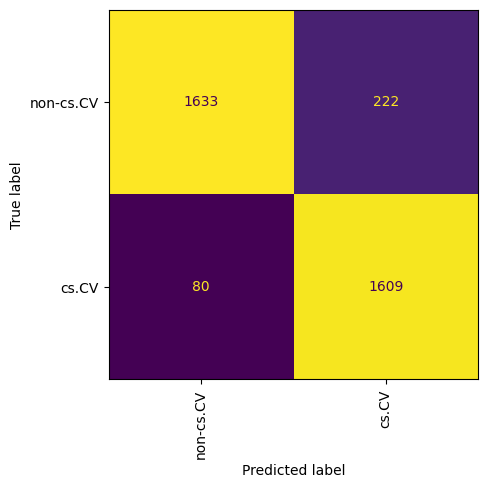

In [14]:
plot_prediction_results(test_data['cs.CV'], pred[0], 'cs.CV')

# <span style="color:#e74c3c;"> cs.LG Class </span> Test Predictions

Mean Squared Error :	0.14447
Weighted F1 Score :	0.857
Accuracy Score :	85.553 %
----------------------------------------------------------------------

 Classification Report:
               precision    recall  f1-score   support

   non-cs.LG       0.78      0.86      0.82      1326
       cs.LG       0.91      0.85      0.88      2218

    accuracy                           0.86      3544
   macro avg       0.84      0.86      0.85      3544
weighted avg       0.86      0.86      0.86      3544

----------------------------------------------------------------------

 Confusion Matrix: 



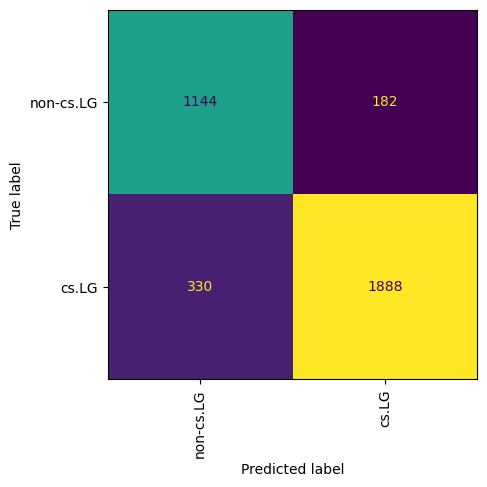

In [15]:
plot_prediction_results(test_data['cs.LG'], pred[1], 'cs.LG')

# <span style="color:#e74c3c;"> stat.ML Class </span> Test Predictions

Mean Squared Error :	0.14447
Weighted F1 Score :	0.842
Accuracy Score :	85.553 %
----------------------------------------------------------------------

 Classification Report:
               precision    recall  f1-score   support

 non-stat.ML       0.90      0.94      0.92      3083
     stat.ML       0.42      0.27      0.33       461

    accuracy                           0.86      3544
   macro avg       0.66      0.61      0.62      3544
weighted avg       0.83      0.86      0.84      3544

----------------------------------------------------------------------

 Confusion Matrix: 



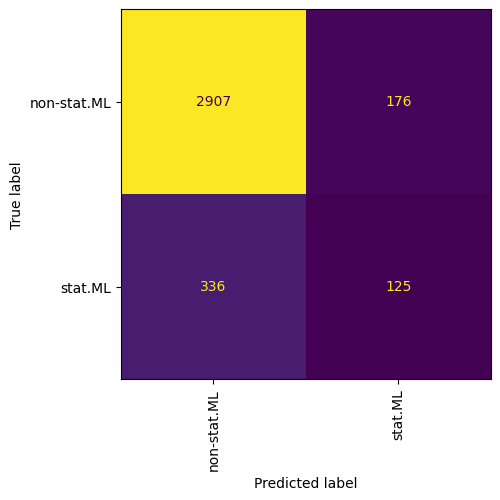

In [16]:
plot_prediction_results(test_data['stat.ML'], pred[3], 'stat.ML')

In [17]:
def create_end2end_multi_class_pipeline(df_data: pd.DataFrame, row_num: int = 0, random: bool = True) -> None:
    if random:
        sample = df_data.sample()
    else:
        sample = df_data.iloc[row_num]
        
    sample_loader = tf.data.Dataset.from_tensor_slices((sample['preprocessed_Abstracts'], sample['cs.CV'], sample['cs.LG'], sample['cs.AI'], sample['stat.ML']))
    sample_dataset = (sample_loader.map(format_dataset, num_parallel_calls = AUTO).batch(1).prefetch(AUTO))
    
    sample_pred = model.predict(sample_dataset, verbose = 0)
    sample_pred = (np.round(sample_pred)).flatten()

    print("sample abstract :\t " + Fore.RED + sample['Abstracts'].values[0] + Style.RESET_ALL)

    print("original categories :\t " + Fore.RED + sample['categories'].values[0] + Style.RESET_ALL)

    pred_cats = []

    for i in range(len(sample_pred)):
        if sample_pred[i] == 1:
            pred_cats.append(unique_cats[i])
        else:
            pass
        
    print("predicted categories :\t " + Fore.BLUE + str(pred_cats) + Style.RESET_ALL)

In [18]:
# a random test sample
create_end2end_multi_class_pipeline(test_data, 0, True)

sample abstract :	 Predicting the presence of major depressive disorder (MDD) using behavioural
and cognitive signals is a highly non-trivial task. The heterogeneous clinical
profile of MDD means that any given speech, facial expression and/or observed
cognitive pattern may be associated with a unique combination of depressive
symptoms. Conventional discriminative machine learning models potentially lack
the complexity to robustly model this heterogeneity. Bayesian networks,
however, may instead be well-suited to such a scenario. These networks are
probabilistic graphical models that efficiently describe the joint probability
distribution over a set of random variables by explicitly capturing their
conditional dependencies. This framework provides further advantages over
standard discriminative modelling by offering the possibility to incorporate
expert opinion in the graphical structure of the models, generating explainable
model predictions, informing about the uncertainty of predict

In [19]:
# a test sample 12
create_end2end_multi_class_pipeline(test_data, 12)

sample abstract :	 Classes of target functions containing a large number of approximately
orthogonal elements are known to be hard to learn by the Statistical Query
algorithms. Recently this classical fact re-emerged in a theory of
gradient-based optimization of neural networks. In the novel framework, the
hardness of a class is usually quantified by the variance of the gradient with
respect to a random choice of a target function.
  A set of functions of the form $x\to ax \bmod p$, where $a$ is taken from
${\mathbb Z}_p$, has attracted some attention from deep learning theorists and
cryptographers recently. This class can be understood as a subset of
$p$-periodic functions on ${\mathbb Z}$ and is tightly connected with a class
of high-frequency periodic functions on the real line.
  We present a mathematical analysis of limitations and challenges associated
with using gradient-based learning techniques to train a high-frequency
periodic function or modular multiplication from examples

In [20]:
# a random test sample
create_end2end_multi_class_pipeline(test_data, None, True)

sample abstract :	 Diffusion models generate high-quality images but require dozens of forward
passes. We introduce Distribution Matching Distillation (DMD), a procedure to
transform a diffusion model into a one-step image generator with minimal impact
on image quality. We enforce the one-step image generator match the diffusion
model at distribution level, by minimizing an approximate KL divergence whose
gradient can be expressed as the difference between 2 score functions, one of
the target distribution and the other of the synthetic distribution being
produced by our one-step generator. The score functions are parameterized as
two diffusion models trained separately on each distribution. Combined with a
simple regression loss matching the large-scale structure of the multi-step
diffusion outputs, our method outperforms all published few-step diffusion
approaches, reaching 2.62 FID on ImageNet 64x64 and 11.49 FID on zero-shot
COCO-30k, comparable to Stable Diffusion but orders of mag

In [21]:
# a test sample
create_end2end_multi_class_pipeline(test_data, 540)

sample abstract :	 Data augmentation methods enrich datasets with augmented data to improve the
performance of neural networks. Recently, automated data augmentation methods
have emerged, which automatically design augmentation strategies. Existing work
focuses on image classification and object detection, whereas we provide the
first study on semantic image segmentation and introduce two new approaches:
\textit{SmartAugment} and \textit{SmartSamplingAugment}. SmartAugment uses
Bayesian Optimization to search over a rich space of augmentation strategies
and achieves a new state-of-the-art performance in all semantic segmentation
tasks we consider. SmartSamplingAugment, a simple parameter-free approach with
a fixed augmentation strategy competes in performance with the existing
resource-intensive approaches and outperforms cheap state-of-the-art data
augmentation methods. Further, we analyze the impact, interaction, and
importance of data augmentation hyperparameters and perform ablatio